Run on Macbook

In [1]:
from __future__ import division, print_function
import numpy as np
from astropy.table import Table, vstack, hstack
import matplotlib.pyplot as plt
import sys, warnings, gc
import fitsio
import healpy as hp

In [2]:
params = {'legend.fontsize': 'x-large',
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large',
         'figure.facecolor':'w'} 
plt.rcParams.update(params)

In [3]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs
from sklearn.preprocessing import StandardScaler

## DR8 South

In [4]:
####################### Data #######################

cat_columns = ['TYPE', 'RA', 'DEC', 'EBV', 
          'FLUX_G_EC', 'FLUX_R_EC', 'FLUX_Z_EC', 'FLUX_W1_EC', 'FLUX_W2_EC', 'FIBERFLUX_Z_EC',
          'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 
          'NOBS_G', 'NOBS_R', 'NOBS_Z',
          'MASKBITS',
          'z_phot_median', 'z_phot_std', 'z_phot_l68', 'z_phot_u68',
          'lrg']

cat = fitsio.read('/Users/rongpu/Documents/Data/desi_photoz/dr8/dr8_south_lrg_20191024.fits', columns=cat_columns)

# Footprint cuts
mask = cat['DEC']<32.375
mask &= cat['DEC']>-30
mask &= (cat['NOBS_G']>=2) & (cat['NOBS_R']>=2) & (cat['NOBS_Z']>=2)
cat = cat[mask]
print(len(cat))

# Apply masks
mask_bad = (cat['MASKBITS']&(2**1)>0) | (cat['MASKBITS']&(2**8)>0) | (cat['MASKBITS']&(2**9)>0) | (cat['MASKBITS']&(2**11)>0) | (cat['MASKBITS']&(2**12)>0) | (cat['MASKBITS']&(2**13)>0)
print('{:} ({:.1f}%) objects removed due to maskbits'.format(np.sum(mask_bad), np.sum(mask_bad)/len(mask_bad)*100))
cat = cat[~mask_bad]
print(len(cat))
cat = Table(cat)

# Select optical-selected LRGs
# opt=0; ir=1; opt_ext=2; ir_ext=3; 
mask = cat['lrg'] & (2**0)>0
cat = cat[mask]
print(len(cat))

9519846
1109178 (11.7%) objects removed due to maskbits
8410668
6154281


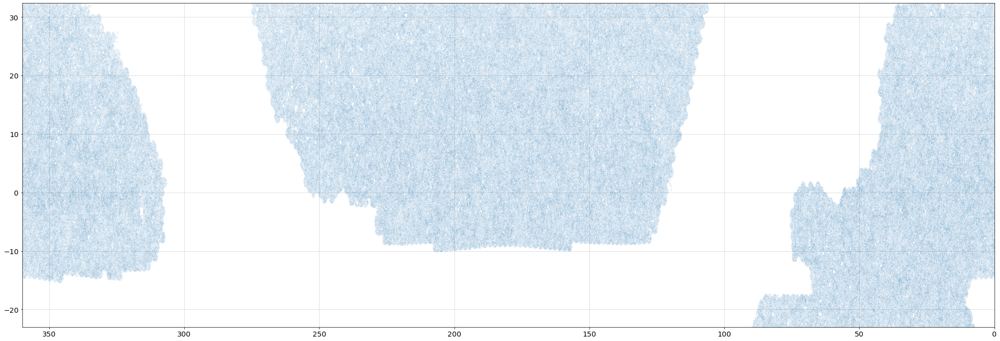

In [5]:
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'], cat['DEC'], '.', ms=0.2, alpha=0.1)
plt.axis([360, 0, -23, 32.375])
plt.grid(alpha=0.5)
plt.show()

In [6]:
outliers = ((cat['z_phot_std']/(1+cat['z_phot_median']))>0.05)
print(np.sum(outliers), np.sum(outliers)/len(cat)*100, '%')

# cat['z_phot_1_sigma'] = (cat['z_phot_u68']-cat['z_phot_l68'])/2
# outliers = ((cat['z_phot_1_sigma']/(1+cat['z_phot_median']))>0.04)
# print(np.sum(outliers), np.sum(outliers)/len(cat)*100, '%')

329637 5.356222765908804 %


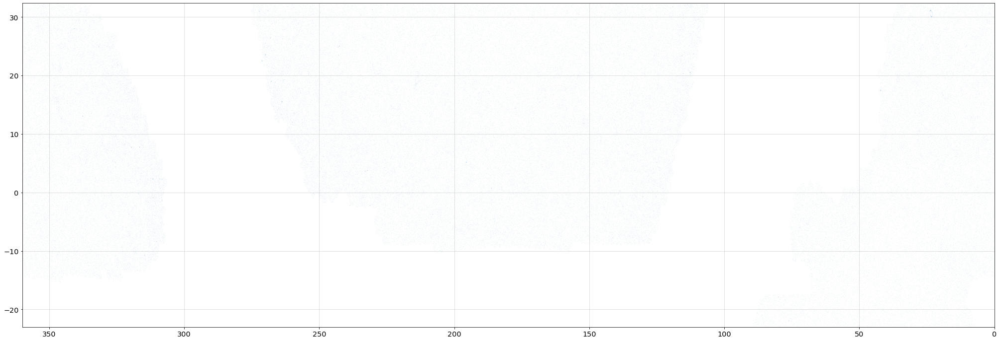

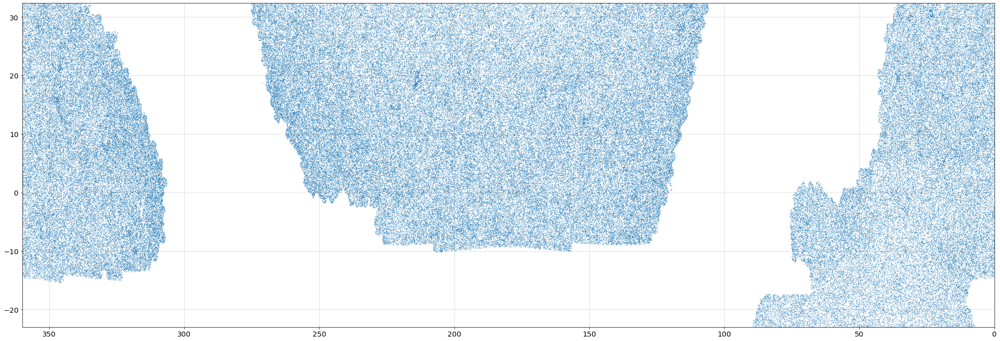

In [7]:
# Same point size for comparison
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'][outliers], cat['DEC'][outliers], '.', ms=0.2, alpha=0.1)
plt.axis([360, 0, -23, 32.375])
plt.grid(alpha=0.5)
plt.show()

# Larger point size
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'][outliers], cat['DEC'][outliers], '.', ms=0.5, alpha=1)
plt.axis([360, 0, -23, 32.375])
plt.grid(alpha=0.5)
plt.show()

In [8]:
X = np.column_stack([cat['RA'][outliers], cat['DEC'][outliers]])

In [9]:
# Compute DBSCAN
db = DBSCAN(eps=0.35, min_samples=30).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
all_samples_mask = labels>=0

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)
print('Fraction of objects in clusters: {:.2f}%'.format(np.sum(core_samples_mask)/len(X)*100))

Estimated number of clusters: 139
Fraction of objects in clusters: 0.63%


In [10]:
print(np.sum(core_samples_mask))
print(np.sum(all_samples_mask))

2065
7259


Objects belonging to all samples:


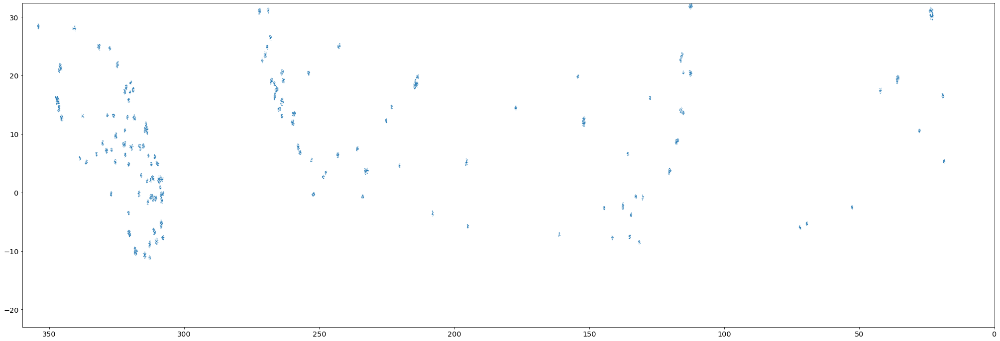

Objects NOT belonging all samples:


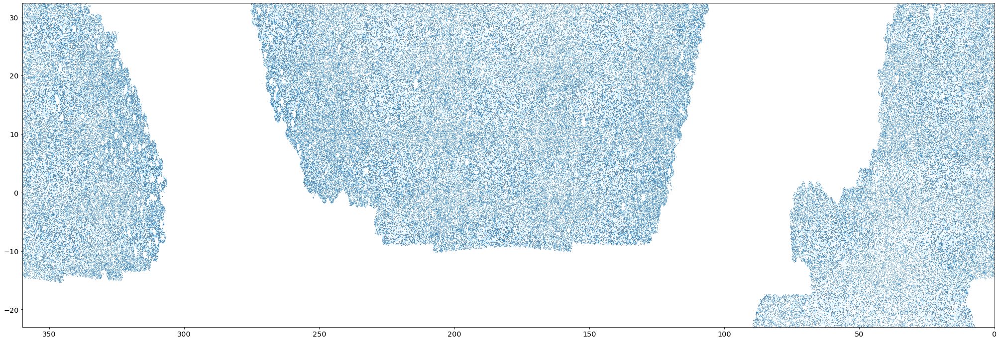

In [11]:
print('Objects belonging to all samples:')
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'][outliers][all_samples_mask], cat['DEC'][outliers][all_samples_mask], '.', markersize=0.5, alpha=1)
plt.axis([360, 0, -23, 32.375])
plt.show()

print('Objects NOT belonging all samples:')
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'][outliers][~all_samples_mask], cat['DEC'][outliers][~all_samples_mask], '.', markersize=0.5, alpha=1)
plt.axis([360, 0, -23, 32.375])
plt.show()

## DR8 North

In [12]:
####################### Data #######################

cat_columns = ['TYPE', 'RA', 'DEC', 'EBV', 
          'FLUX_G_EC', 'FLUX_R_EC', 'FLUX_Z_EC', 'FLUX_W1_EC', 'FLUX_W2_EC', 'FIBERFLUX_Z_EC',
          'FLUX_IVAR_G', 'FLUX_IVAR_R', 'FLUX_IVAR_Z', 'FLUX_IVAR_W1', 'FLUX_IVAR_W2', 
          'NOBS_G', 'NOBS_R', 'NOBS_Z',
          'MASKBITS',
          'z_phot_median', 'z_phot_std', 'z_phot_l68', 'z_phot_u68',
          'lrg']

cat = fitsio.read('/Users/rongpu/Documents/Data/desi_photoz/dr8/dr8_north_lrg_20191024.fits', columns=cat_columns)

# Footprint cuts
mask = cat['DEC']>32.375
mask &= (cat['NOBS_G']>=2) & (cat['NOBS_R']>=2) & (cat['NOBS_Z']>=2)
cat = cat[mask]
print(len(cat))

# Apply masks
mask_bad = (cat['MASKBITS']&(2**1)>0) | (cat['MASKBITS']&(2**8)>0) | (cat['MASKBITS']&(2**9)>0) | (cat['MASKBITS']&(2**11)>0) | (cat['MASKBITS']&(2**12)>0) | (cat['MASKBITS']&(2**13)>0)
print('{:} ({:.1f}%) objects removed due to maskbits'.format(np.sum(mask_bad), np.sum(mask_bad)/len(mask_bad)*100))
cat = cat[~mask_bad]
print(len(cat))
cat = Table(cat)

# Select optical-selected LRGs
# opt=0; ir=1; opt_ext=2; ir_ext=3; 
mask = cat['lrg'] & (2**0)>0
cat = cat[mask]
print(len(cat))

4438444
566975 (12.8%) objects removed due to maskbits
3871469
2802214


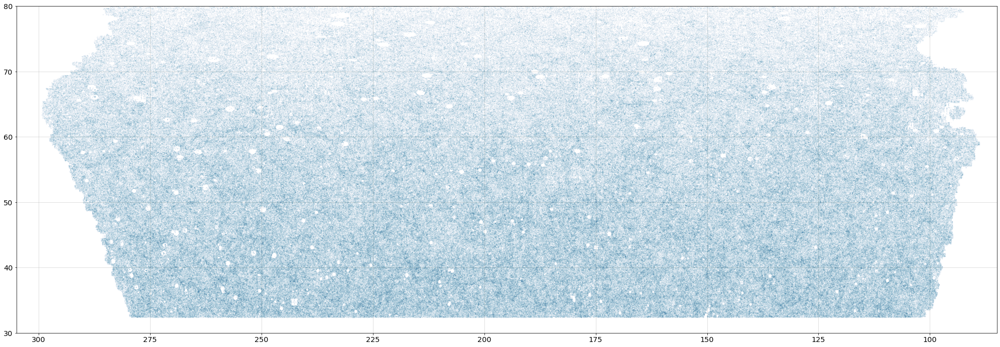

In [13]:
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'], cat['DEC'], '.', ms=0.5, alpha=0.1)
plt.axis([305, 85, 30, 80])
plt.grid(alpha=0.5)
plt.show()

In [14]:
outliers = ((cat['z_phot_std']/(1+cat['z_phot_median']))>0.05)
print(np.sum(outliers), np.sum(outliers)/len(cat)*100, '%')

# cat['z_phot_1_sigma'] = (cat['z_phot_u68']-cat['z_phot_l68'])/2
# outliers = ((cat['z_phot_1_sigma']/(1+cat['z_phot_median']))>0.04)
# print(np.sum(outliers), np.sum(outliers)/len(cat)*100, '%')

182845 6.525019145575605 %


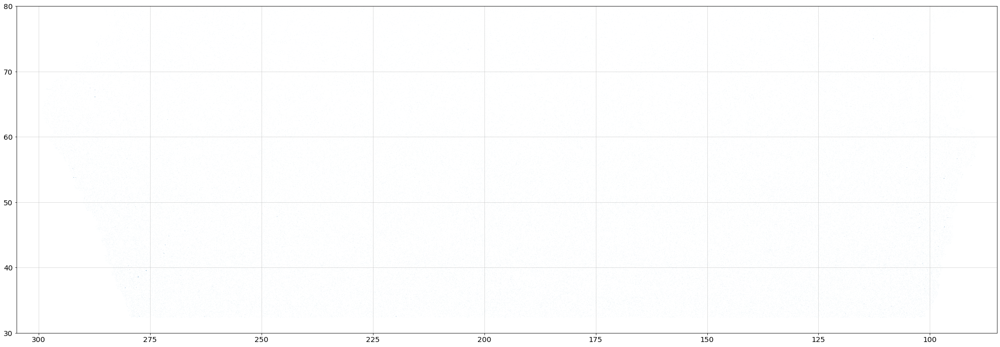

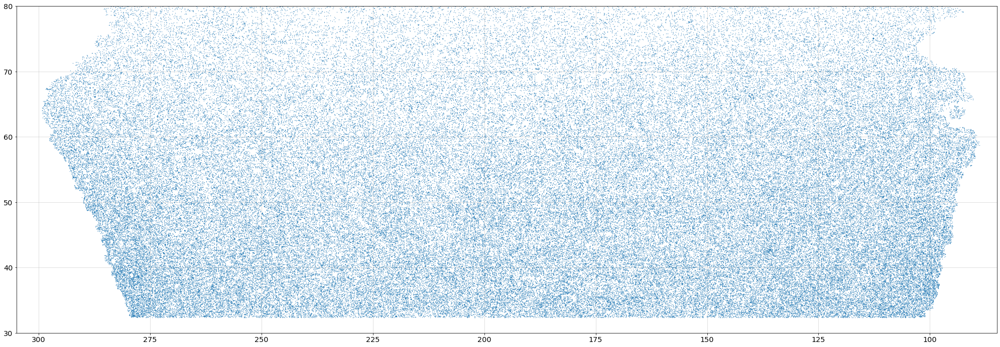

In [15]:
# Same point size for comparison
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'][outliers], cat['DEC'][outliers], '.', ms=0.2, alpha=0.1)
plt.axis([305, 85, 30, 80])
plt.grid(alpha=0.5)
plt.show()

# Larger point size
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'][outliers], cat['DEC'][outliers], '.', ms=0.7, alpha=1)
plt.axis([305, 85, 30, 80])
plt.grid(alpha=0.5)
plt.show()

In [16]:
X = np.column_stack([cat['RA'][outliers], cat['DEC'][outliers]])

In [17]:
# Compute DBSCAN
db = DBSCAN(eps=0.35, min_samples=30).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
all_samples_mask = labels>=0

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)
print('Fraction of objects in clusters: {:.2f}%'.format(np.sum(core_samples_mask)/len(X)*100))

Estimated number of clusters: 43
Fraction of objects in clusters: 0.40%


In [18]:
print(np.sum(core_samples_mask))
print(np.sum(all_samples_mask))

724
2136


Objects belonging to all samples:


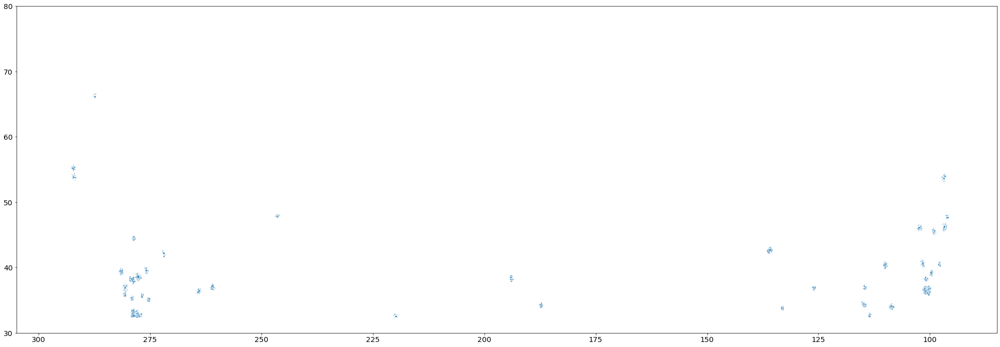

Objects NOT belonging all samples:


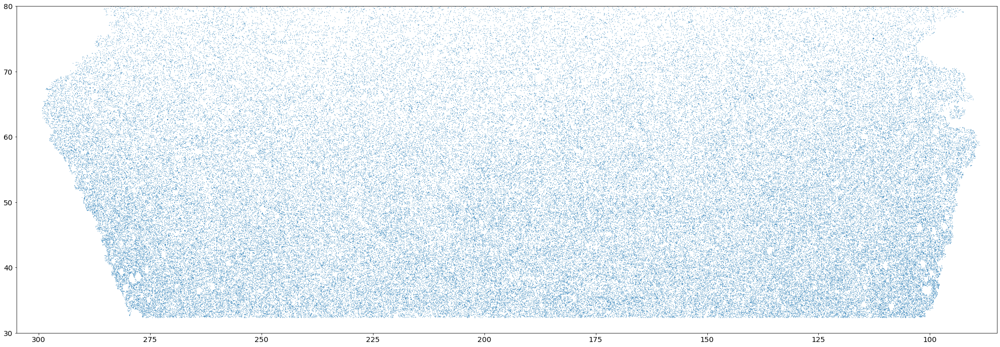

In [19]:
print('Objects belonging to all samples:')
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'][outliers][all_samples_mask], cat['DEC'][outliers][all_samples_mask], '.', markersize=0.5, alpha=1)
plt.axis([305, 85, 30, 80])
plt.show()

print('Objects NOT belonging all samples:')
plt.figure(figsize=(35, 12))
plt.plot(cat['RA'][outliers][~all_samples_mask], cat['DEC'][outliers][~all_samples_mask], '.', markersize=0.5, alpha=1)
plt.axis([305, 85, 30, 80])
plt.show()